### **1. Carregamentos**

In [1]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go

In [2]:
df = pd.read_csv('infringement_dataset.csv')

### **2. Pré-processamento de dados**

In [3]:
df.shape

(307511, 69)

In [4]:
df.head()

,loan_id,infringed,contract_type,gender,has_own_car,has_own_realty,num_children,annual_income,credit_amount,credit_annuity,...,SK_ID_CURR,avg_days_decision,past_avg_amount_annuity,past_avg_amt_application,past_avg_amt_credit,past_loans_approved,past_loans_refused,past_loans_canceled,past_loans_unused,past_loans_total
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,100002.0,606.000000,9251.775,179055.00,179055.00,1.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,100003.0,1305.000000,56553.990,435436.50,484191.00,3.0,0.0,0.0,0.0,3.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,100004.0,815.000000,5357.250,24282.00,20106.00,1.0,0.0,0.0,0.0,1.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,100006.0,272.444444,23651.175,272203.26,291695.50,5.0,3.0,1.0,0.0,9.0
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,100007.0,1222.833333,12278.805,150530.25,166638.75,6.0,0.0,0.0,0.0,6.0


In [5]:
df.dtypes.unique()

array([dtype('int64'), dtype('O'), dtype('float64')], dtype=object)

In [6]:
df.select_dtypes(include=['O']).head()

,contract_type,gender,has_own_car,has_own_realty,income_type,education,family_status,housing_type,occupation_type,organization_type,first_name,last_name,address
0,Cash loans,M,N,Y,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,Business Entity Type 3,Robert,Watkins,"PSC 6214, Box 0499\nAPO AE 50653"
1,Cash loans,F,N,N,State servant,Higher education,Married,House / apartment,Core staff,School,Jane,Navarro,"537 Jones Views Suite 234\nWebbton, AR 28006"
2,Revolving loans,M,Y,Y,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,Government,David,Seagraves,"7418 Brown Rapid Apt. 502\nLake Amber, OK 60478"
3,Cash loans,F,N,Y,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,Business Entity Type 3,Deborah,Tandy,"812 Macias Roads Suite 039\nHelenland, MA 10754"
4,Cash loans,M,N,Y,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,Religion,David,Walker,"093 Laura Overpass Suite 487\nLake Bryanside, ..."


In [7]:
print(df.gender.unique())
print(df.has_own_car.unique())
print(df.has_own_realty.unique())

['M' 'F' 'XNA']
['N' 'Y']
['Y' 'N']


In [8]:
len(df[df.gender=='XNA'])

4

In [9]:
df = df[df.gender!='XNA']

In [10]:
print(df.gender.unique())
print(df.has_own_car.unique())
print(df.has_own_realty.unique())

['M' 'F']
['N' 'Y']
['Y' 'N']


In [11]:
df['gender'] = df['gender'].replace({'M': 1, 'F': 0})
df['has_own_car'] = df['has_own_car'].replace({'Y': 1, 'N': 0})
df['has_own_realty'] = df['has_own_realty'].replace({'Y': 1, 'N': 0})

In [12]:
df.dtypes.head(10)

loan_id             int64
infringed           int64
contract_type      object
gender              int64
has_own_car         int64
has_own_realty      int64
num_children        int64
annual_income     float64
credit_amount     float64
credit_annuity    float64
dtype: object

In [13]:
df1 = df.select_dtypes(include=['int64', 'float64'])

In [14]:
df1.shape

(307507, 59)

In [15]:
df1.nunique()

loan_id                     307507
infringed                        2
gender                           2
has_own_car                      2
has_own_realty                   2
num_children                    15
annual_income                 2548
credit_amount                 5603
credit_annuity               13672
goods_valuation               1002
age                             50
days_employed                12574
car_age                         62
provided_mobilephone             2
provided_workphone               2
provided_homephone               2
mobilephone_reachable            2
provided_email                   2
num_family_members              17
region_rating                    3
score_ext_1                 114583
score_ext_2                 119830
score_ext_3                    814
appendix_a                       2
appendix_b                       2
appendix_c                       2
appendix_d                       2
appendix_e                       2
appendix_f          

Let's drop the Loan_ID column as it is does not provide any useful information

In [16]:
df1.drop(['loan_id'], axis=1, inplace=True)

In [17]:
df1.columns

Index(['infringed', 'gender', 'has_own_car', 'has_own_realty', 'num_children',
       'annual_income', 'credit_amount', 'credit_annuity', 'goods_valuation',
       'age', 'days_employed', 'car_age', 'provided_mobilephone',
       'provided_workphone', 'provided_homephone', 'mobilephone_reachable',
       'provided_email', 'num_family_members', 'region_rating', 'score_ext_1',
       'score_ext_2', 'score_ext_3', 'appendix_a', 'appendix_b', 'appendix_c',
       'appendix_d', 'appendix_e', 'appendix_f', 'appendix_g', 'appendix_h',
       'appendix_i', 'appendix_j', 'appendix_k', 'appendix_l', 'appendix_m',
       'appendix_n', 'appendix_o', 'appendix_p', 'appendix_q', 'appendix_r',
       'appendix_s', 'appendix_t', 'num_req_bureau_hour', 'num_req_bureau_day',
       'num_req_bureau_week', 'num_req_bureau_month', 'num_req_bureau_qrt',
       'num_req_bureau_year', 'SK_ID_CURR', 'avg_days_decision',
       'past_avg_amount_annuity', 'past_avg_amt_application',
       'past_avg_amt_credit',

In [18]:
columns_to_remove = ['region_rating', 'score_ext_1', 'score_ext_2', 'score_ext_3', 'appendix_a', 'appendix_b', 'appendix_c',
                     'appendix_d', 'appendix_e', 'appendix_f', 'appendix_g', 'appendix_h', 'appendix_i', 'appendix_j',
                     'appendix_k', 'appendix_l', 'appendix_m', 'appendix_n', 'appendix_o', 'appendix_p', 'appendix_q',
                     'appendix_r', 'appendix_s', 'appendix_t', 'num_req_bureau_hour', 'num_req_bureau_day', 'num_req_bureau_week',
                     'num_req_bureau_month', 'num_req_bureau_qrt', 'num_req_bureau_year', 'SK_ID_CURR', 'avg_days_decision']
df2 = df1.drop(columns_to_remove, axis=1)

In [19]:
df2.shape

(307507, 26)

In [20]:
df2.nunique()

infringed                        2
gender                           2
has_own_car                      2
has_own_realty                   2
num_children                    15
annual_income                 2548
credit_amount                 5603
credit_annuity               13672
goods_valuation               1002
age                             50
days_employed                12574
car_age                         62
provided_mobilephone             2
provided_workphone               2
provided_homephone               2
mobilephone_reachable            2
provided_email                   2
num_family_members              17
past_avg_amount_annuity     267470
past_avg_amt_application    191743
past_avg_amt_credit         210622
past_loans_approved             26
past_loans_refused              39
past_loans_canceled             46
past_loans_unused               11
past_loans_total                65
dtype: int64

In [21]:
round(df2.isna().sum()/len(df2),3).sort_values(ascending=False)

car_age                     0.660
past_avg_amount_annuity     0.055
past_loans_total            0.054
past_loans_unused           0.054
past_loans_canceled         0.054
past_loans_refused          0.054
past_loans_approved         0.054
past_avg_amt_credit         0.054
past_avg_amt_application    0.054
goods_valuation             0.001
provided_homephone          0.000
num_family_members          0.000
provided_email              0.000
mobilephone_reachable       0.000
infringed                   0.000
gender                      0.000
provided_mobilephone        0.000
days_employed               0.000
age                         0.000
credit_annuity              0.000
credit_amount               0.000
annual_income               0.000
num_children                0.000
has_own_realty              0.000
has_own_car                 0.000
provided_workphone          0.000
dtype: float64

#### Decidindo ficar com car_age, mesmo eliminando todos os valores nulos, resta 34% da base original, ou ~100K linhas!

In [22]:
base_all = df2.dropna()

In [23]:
base_all.shape

(98336, 26)

In [24]:
base_all.nunique()

infringed                       2
gender                          2
has_own_car                     1
has_own_realty                  2
num_children                   12
annual_income                 907
credit_amount                4251
credit_annuity              10939
goods_valuation               634
age                            49
days_employed                9461
car_age                        61
provided_mobilephone            1
provided_workphone              2
provided_homephone              2
mobilephone_reachable           2
provided_email                  2
num_family_members             14
past_avg_amount_annuity     94950
past_avg_amt_application    77928
past_avg_amt_credit         84441
past_loans_approved            25
past_loans_refused             31
past_loans_canceled            37
past_loans_unused               9
past_loans_total               55
dtype: int64

Depois de remover os registos com valores nulos reparamos que a coluna "provided_mobilephone" passa a ser constante, pelo que vamos remover essa coluna.

In [25]:
base_all.drop(["provided_mobilephone", "has_own_car"], axis=1, inplace=True)

Antes de realizar o PCA é importante escalar os dados, uma vez que se tal não for feito haverá um grande bias para as variáveis com uma maiores intervalos.

In [26]:
from sklearn.preprocessing import StandardScaler

In [27]:
base_all

,infringed,gender,has_own_realty,num_children,annual_income,credit_amount,credit_annuity,goods_valuation,age,days_employed,...,provided_email,num_family_members,past_avg_amount_annuity,past_avg_amt_application,past_avg_amt_credit,past_loans_approved,past_loans_refused,past_loans_canceled,past_loans_unused,past_loans_total
2,0,1,1,0,67500.0,135000.0,6750.0,135000.0,52,-225,...,0,1.0,5357.250000,24282.000000,20106.000000,1.0,0.0,0.0,0.0,1.0
6,0,0,1,1,171000.0,1560726.0,41301.0,1395000.0,37,-3130,...,0,3.0,10051.412143,76741.714286,70137.642857,7.0,0.0,0.0,0.0,7.0
7,0,1,1,0,360000.0,1530000.0,42075.0,1530000.0,51,-449,...,0,2.0,27463.410000,247212.000000,260811.000000,1.0,0.0,0.0,0.0,1.0
13,0,1,0,1,225000.0,918468.0,28966.5,697500.0,38,-3028,...,0,3.0,14375.407500,176665.500000,175565.250000,2.0,0.0,0.0,0.0,2.0
15,0,1,1,0,157500.0,299772.0,20160.0,247500.0,23,-1157,...,0,1.0,10518.615000,84136.500000,104683.500000,1.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307492,0,1,1,0,585000.0,1575000.0,43443.0,1575000.0,57,-1618,...,0,2.0,20817.933750,204750.000000,226901.250000,3.0,0.0,1.0,0.0,4.0
307494,0,1,0,1,270000.0,479700.0,46858.5,450000.0,40,-6573,...,0,3.0,9638.730000,295915.162500,283977.000000,1.0,0.0,0.0,1.0,2.0
307495,0,1,0,0,180000.0,808650.0,23773.5,675000.0,57,-7438,...,0,2.0,5773.725000,9056.250000,75919.500000,2.0,0.0,0.0,0.0,2.0
307497,0,0,1,0,180000.0,270126.0,12028.5,193500.0,45,-1222,...,0,2.0,14918.385000,181999.500000,228491.000000,6.0,3.0,0.0,0.0,9.0


In [28]:
scaler = StandardScaler()
scaler.fit(base_all)
base_all_scaled = scaler.transform(base_all)

In [29]:
base_all_scaled = pd.DataFrame(base_all_scaled, columns = base_all.columns, index=base_all.index)

In [30]:
base_all_scaled

,infringed,gender,has_own_realty,num_children,annual_income,credit_amount,credit_annuity,goods_valuation,age,days_employed,...,provided_email,num_family_members,past_avg_amount_annuity,past_avg_amt_application,past_avg_amt_credit,past_loans_approved,past_loans_refused,past_loans_canceled,past_loans_unused,past_loans_total
2,-0.283175,0.875031,0.643548,-0.671862,-0.951191,-1.233712,-1.525371,-1.175306,0.988294,-0.309331,...,-0.272278,-1.461608,-0.915624,-0.813616,-0.866832,-0.978033,-0.509174,-0.472149,-0.275755,-0.948440
6,-0.283175,-1.142816,0.643548,0.603021,-0.169873,2.164829,0.763901,2.087373,-0.394477,-0.335973,...,-0.272278,0.700571,-0.495858,-0.517363,-0.602445,1.867098,-0.509174,-0.472149,-0.275755,0.532377
7,-0.283175,0.875031,0.643548,-0.671862,1.256881,2.091587,0.815184,2.436946,0.896110,-0.311385,...,-0.272278,-0.380519,1.061175,0.445324,0.405151,-0.978033,-0.509174,-0.472149,-0.275755,-0.948440
13,-0.283175,0.875031,-1.553886,0.603021,0.237771,0.633862,-0.053355,0.281247,-0.302292,-0.335037,...,-0.272278,0.700571,-0.109193,0.046931,-0.045322,-0.503844,-0.509174,-0.472149,-0.275755,-0.701637
15,-0.283175,0.875031,0.643548,-0.671862,-0.271784,-0.840940,-0.636854,-0.883995,-1.685063,-0.317878,...,-0.272278,-1.461608,-0.454079,-0.475603,-0.419890,-0.978033,-0.509174,-0.472149,-0.275755,-0.948440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307492,-0.283175,0.875031,0.643548,-0.671862,2.955398,2.198855,0.905825,2.553470,1.449218,-0.322106,...,-0.272278,-0.380519,0.466916,0.205530,0.225958,-0.029656,-0.509174,0.073833,-0.275755,-0.208032
307494,-0.283175,0.875031,-1.553886,0.603021,0.577474,-0.412041,1.132128,-0.359636,-0.117922,-0.367549,...,-0.272278,0.700571,-0.532761,0.720362,0.527569,-0.978033,-0.509174,-0.472149,2.365390,-0.701637
307495,-0.283175,0.875031,-1.553886,-0.671862,-0.101932,0.372086,-0.397432,0.222985,1.449218,-0.375482,...,-0.272278,-0.380519,-0.878382,-0.899599,-0.571891,-0.503844,-0.509174,-0.472149,-0.275755,-0.701637
307497,-0.283175,-1.142816,0.643548,-0.671862,-0.101932,-0.911608,-1.175629,-1.023825,0.343001,-0.318475,...,-0.272278,-0.380519,-0.060639,0.077053,0.234359,1.392909,1.373895,-0.472149,-0.275755,1.025983


In [31]:
# Base somente Homens --> exclui-se a coluna de gênero
base_m = base_all_scaled[base_all.gender==1].drop('gender',axis=1)
print(base_m.shape)
# Base somente Mulheres --> exclui-se a coluna de gênero
base_f = base_all_scaled[base_all.gender==0].drop('gender',axis=1)
print(base_f.shape)

(55693, 23)
(42643, 23)


#### A distribuição entre homens (56,5%) e mulheres (43,5%) é relativamente balanceada, o que permite fazer comparações entre esses grupos sem muito viés.

### **3. Análise Base Geral**

### 3.1. Primeiras infos PCA

In [32]:
from sklearn.decomposition import PCA

In [33]:
# Inicialize o modelo PCA com o número de componentes desejado (por exemplo, 2 componentes)
pca = PCA(n_components=len(base_all_scaled.columns))
pca.fit_transform(base_all_scaled)

# Obtenha as proporções de variância explicada
explained_variance = pca.explained_variance_ratio_

# Obtenha os autovalores
eigenvalues = pca.explained_variance_

print("Variância explicada")
print(explained_variance)

print("\nAutovalores")
print(eigenvalues)

Variância explicada
[1.52166962e-01 1.14781816e-01 1.11024073e-01 7.84551481e-02
 7.01484539e-02 4.76888644e-02 4.54895686e-02 4.42948766e-02
 4.19338563e-02 4.09830858e-02 4.04426308e-02 3.68750194e-02
 3.47690138e-02 3.17148680e-02 3.01565105e-02 2.77853461e-02
 2.26669950e-02 1.39985167e-02 9.83695870e-03 3.33435998e-03
 8.99561240e-04 5.25380534e-04 2.81352326e-05 1.02683469e-32]

Autovalores
[3.65204423e+00 2.75479159e+00 2.66460484e+00 1.88294270e+00
 1.68358001e+00 1.14454439e+00 1.09176075e+00 1.06308785e+00
 1.00642279e+00 9.83604062e-01 9.70633009e-01 8.85009465e-01
 8.34464817e-01 7.61164573e-01 7.23763612e-01 6.66855089e-01
 5.44013411e-01 3.35967817e-01 2.36089410e-01 8.00254533e-02
 2.15896893e-02 1.26092610e-02 6.75252448e-04 2.46442833e-31]


### 4.2. Scree plot

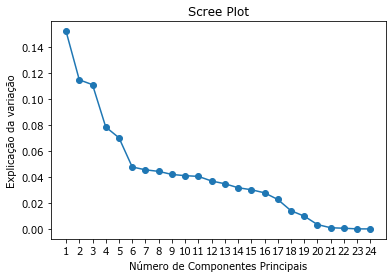

In [34]:
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-')
plt.xticks(np.arange(1, len(explained_variance) + 1, step=1))
plt.xlabel('Número de Componentes Principais')
plt.ylabel('Explicação da variação')
plt.title('Scree Plot')

plt.show()

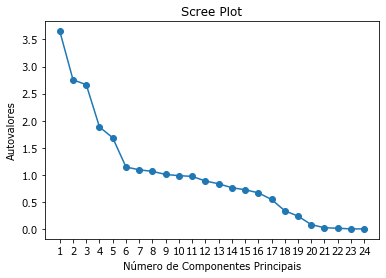

In [35]:
plt.plot(range(1, len(explained_variance) + 1), eigenvalues, marker='o', linestyle='-')
plt.xticks(np.arange(1, len(explained_variance) + 1, step=1))
plt.xlabel('Número de Componentes Principais')
plt.ylabel('Autovalores')
plt.title('Scree Plot')

plt.show()

#### Este segundo é o scree plot em si, pois no eixo Y são representados os autovalores.

#### Portanto, **2 componentes** são suficientes para a explicação de base_all.

### 3.3. Loadings (Variáveis que mais contribuem para os 2 componentes)

In [36]:
# Obtenha os autovetores (vetores próprios)
eigenvectors = pca.components_

# Crie um DataFrame para visualizar os autovetores com os nomes das variáveis originais
eigenvectors_df = pd.DataFrame(eigenvectors, columns=base_all_scaled.columns)

# Agora, para cada componente principal, você pode ver como as variáveis originais contribuem para ele.
# Por exemplo, para o primeiro componente principal:
component_1 = eigenvectors_df.iloc[0]
component_2 = eigenvectors_df.iloc[1]

In [37]:
print("Contribuição das variáveis para o primeiro componente principal:")
print(component_1.sort_values(ascending=False))

Contribuição das variáveis para o primeiro componente principal:
past_avg_amt_credit         0.400866
past_avg_amt_application    0.399492
past_avg_amount_annuity     0.394621
goods_valuation             0.336391
credit_amount               0.334410
credit_annuity              0.321029
annual_income               0.227875
past_loans_total            0.189672
past_loans_canceled         0.154024
age                         0.144226
past_loans_refused          0.138214
past_loans_approved         0.130460
provided_email              0.058380
days_employed               0.048487
has_own_realty              0.018752
mobilephone_reachable      -0.002706
infringed                  -0.018581
past_loans_unused          -0.023520
gender                     -0.031962
provided_homephone         -0.033659
num_family_members         -0.040322
provided_workphone         -0.049705
num_children               -0.068104
car_age                    -0.097377
Name: 0, dtype: float64


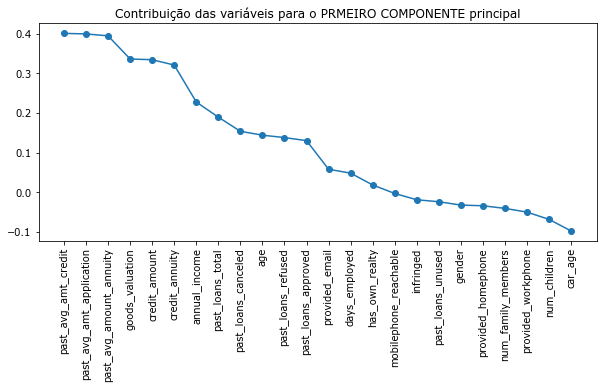

In [38]:
plt.figure(figsize=(10,4))
plt.title('Contribuição das variáveis para o PRMEIRO COMPONENTE principal')
plt.plot(component_1.sort_values(ascending=False), marker='o', linestyle='-')
plt.xticks(rotation=90)

plt.show()

In [39]:
print("Contribuição das variáveis para a segunda componente principal:")
print(component_2.sort_values(ascending=False))

Contribuição das variáveis para a segunda componente principal:
provided_workphone          0.420103
num_children                0.284863
num_family_members          0.273418
credit_annuity              0.250816
goods_valuation             0.249998
credit_amount               0.249044
annual_income               0.152985
provided_homephone          0.121933
gender                      0.066808
provided_email              0.019861
mobilephone_reachable       0.006701
infringed                   0.001921
past_loans_unused          -0.015284
past_avg_amount_annuity    -0.024314
past_avg_amt_application   -0.038983
past_avg_amt_credit        -0.045114
car_age                    -0.046699
has_own_realty             -0.065817
past_loans_approved        -0.162205
past_loans_canceled        -0.184187
past_loans_refused         -0.191495
past_loans_total           -0.244405
age                        -0.305276
days_employed              -0.419851
Name: 1, dtype: float64


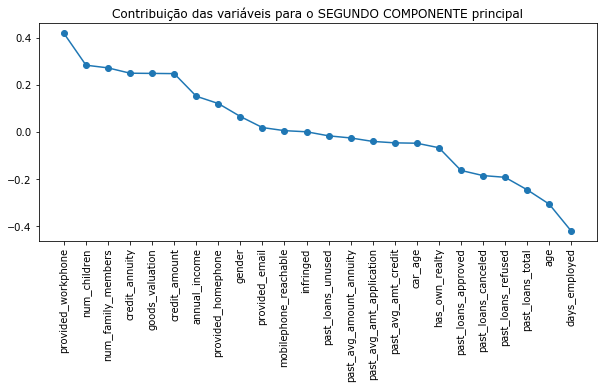

In [40]:
plt.figure(figsize=(10,4))
plt.title('Contribuição das variáveis para o SEGUNDO COMPONENTE principal')
plt.plot(component_2.sort_values(ascending=False), marker='o', linestyle='-')
plt.xticks(rotation=90)

plt.show()

In [41]:
component_3 = eigenvectors_df.iloc[2]
component_4 = eigenvectors_df.iloc[3]
component_5 = eigenvectors_df.iloc[4]
component_6 = eigenvectors_df.iloc[5]
component_7 = eigenvectors_df.iloc[5]
component_8 = eigenvectors_df.iloc[7]
component_9 = eigenvectors_df.iloc[8]
component_10 = eigenvectors_df.iloc[9]

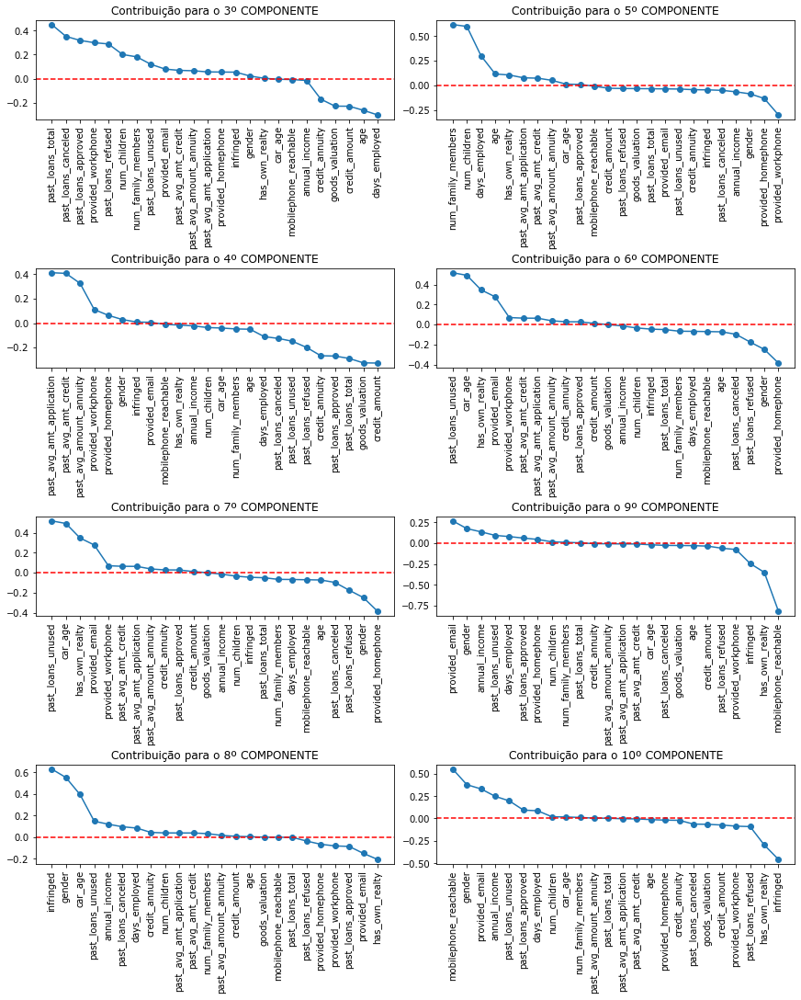

In [42]:
fig, axs = plt.subplots(4, 2, figsize=(12, 15), constrained_layout=True)

axs[0][0].set_title('Contribuição para o 3º COMPONENTE')
axs[0][0].plot(component_3.sort_values(ascending=False), marker='o', linestyle='-')
axs[0][0].axhline(y=0, color='red', linestyle='--')
axs[0][0].tick_params(axis='x', labelrotation=90)

axs[1][0].set_title('Contribuição para o 4º COMPONENTE')
axs[1][0].plot(component_4.sort_values(ascending=False), marker='o', linestyle='-')
axs[1][0].axhline(y=0, color='red', linestyle='--')
axs[1][0].tick_params(axis='x', labelrotation=90)

axs[0][1].set_title('Contribuição para o 5º COMPONENTE')
axs[0][1].plot(component_5.sort_values(ascending=False), marker='o', linestyle='-')
axs[0][1].axhline(y=0, color='red', linestyle='--')
axs[0][1].tick_params(axis='x', labelrotation=90)

axs[1][1].set_title('Contribuição para o 6º COMPONENTE')
axs[1][1].plot(component_6.sort_values(ascending=False), marker='o', linestyle='-')
axs[1][1].axhline(y=0, color='red', linestyle='--')
axs[1][1].tick_params(axis='x', labelrotation=90)

axs[2][0].set_title('Contribuição para o 7º COMPONENTE')
axs[2][0].plot(component_7.sort_values(ascending=False), marker='o', linestyle='-')
axs[2][0].axhline(y=0, color='red', linestyle='--')
axs[2][0].tick_params(axis='x', labelrotation=90)

axs[3][0].set_title('Contribuição para o 8º COMPONENTE')
axs[3][0].plot(component_8.sort_values(ascending=False), marker='o', linestyle='-')
axs[3][0].axhline(y=0, color='red', linestyle='--')
axs[3][0].tick_params(axis='x', labelrotation=90)

axs[2][1].set_title('Contribuição para o 9º COMPONENTE')
axs[2][1].plot(component_9.sort_values(ascending=False), marker='o', linestyle='-')
axs[2][1].axhline(y=0, color='red', linestyle='--')
axs[2][1].tick_params(axis='x', labelrotation=90)

axs[3][1].set_title('Contribuição para o 10º COMPONENTE')
axs[3][1].plot(component_10.sort_values(ascending=False), marker='o', linestyle='-')
axs[3][1].axhline(y=0, color='red', linestyle='--')
axs[3][1].tick_params(axis='x', labelrotation=90)
plt.show()

### Resumo dos Loadings

In [43]:
# Trabalhando com apenas 2 componentes
pca = PCA(n_components=2)
pca.fit(base_all_scaled)
base_all_pca = pca.transform(base_all_scaled)

In [44]:
loadings = pd.DataFrame(pca.components_.T, columns=['PC1','PC2'], index=base_all_scaled.columns)
round(loadings,3)

,PC1,PC2
infringed,-0.019,0.002
gender,-0.032,0.067
has_own_realty,0.019,-0.066
num_children,-0.068,0.285
annual_income,0.228,0.153
credit_amount,0.334,0.249
credit_annuity,0.321,0.251
goods_valuation,0.336,0.250
age,0.144,-0.305
days_employed,0.048,-0.420


#### Abaixo, a participação de uma variável em relação às duas! Aqui não é o tamanho do impacto, mas como cada uma delas impacta nas componentes. Por exemplo, loan_id impacta muito mais em PC2 apesar do absoluto dessa var ser quase zero (tabela acima).

In [45]:
norm_loadings = loadings.div(loadings.sum(axis=1), axis=0)
round(norm_loadings,3)

,PC1,PC2
infringed,1.116,-0.116
gender,-0.917,1.917
has_own_realty,-0.398,1.398
num_children,-0.314,1.314
annual_income,0.598,0.402
credit_amount,0.573,0.427
credit_annuity,0.561,0.439
goods_valuation,0.574,0.426
age,-0.896,1.896
days_employed,-0.131,1.131


### 3.4. Loading plot

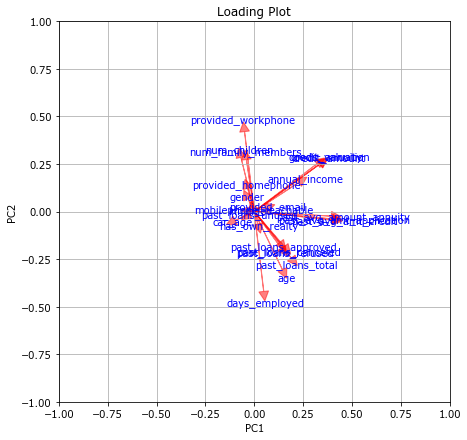

In [46]:
def loading_plot(coeff, labels):
    n = coeff.shape[0]
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1], head_width = 0.05, head_length = 0.05, color = 'red',alpha = 0.5)
        plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'blue', ha = 'center', va = 'center')
    plt.xlim(-1,1)
    plt.ylim(-1,1)
    plt.xlabel('PC1')
    plt.ylabel('PC2')
    plt.grid()

fig, ax = plt.subplots(figsize = (7,7))
plt.title('Loading Plot')
loading_plot(pca.components_.T, base_all_scaled.columns)

#### Percebe-se que as duas variáveis principais que melhor explicam cada componente estão altamente correlacionadas. De um lado, "goods_valuation" com "credit_amount" e, de outro, "past_avg_amt_credit" com "past_avg_amt_application".

#### Além disso, cada um desses pares não se relacionam entre si (cos~0º)...

#### Annual income tem força menor, mas é a 5ªa variável, pois é a 5ª a explicar PC1 e 3ª de PCA. Possui correlação positiva média com as quatro variáveis principais.

### 3.5. Score plot

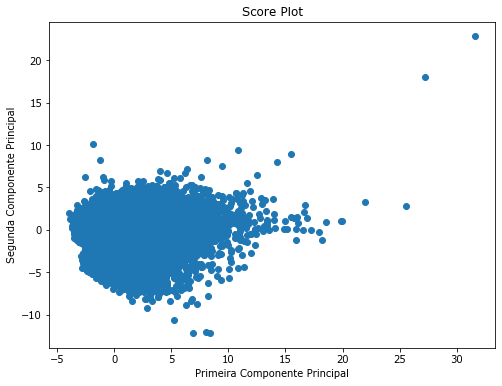

In [47]:
plt.figure(figsize=(8,6))
plt.scatter(base_all_pca[:, 0], base_all_pca[:, 1])
plt.xlabel('Primeira Componente Principal')
plt.ylabel('Segunda Componente Principal')
plt.title('Score Plot')

plt.show()

#### O score plot mostra que não existe nenhuma relação óbvia entre as duas componentes senão uma relação de perpendicularidade entre ambas.
#### Não existe grandes clusteres bem separados também.
#### Poucos são os pontos de outlier, sendo os principais aqueles que se encontram em X>3 e Y<2 (menos de 1 dúzia de ponto).

### 3.6. Análise de resíduos

In [48]:
reconstructed_matrix = pca.inverse_transform(base_all_pca)

In [49]:
e = base_all_scaled - reconstructed_matrix

##### Análise por linha

In [50]:
distance_point = np.sum(e**2, axis=1)

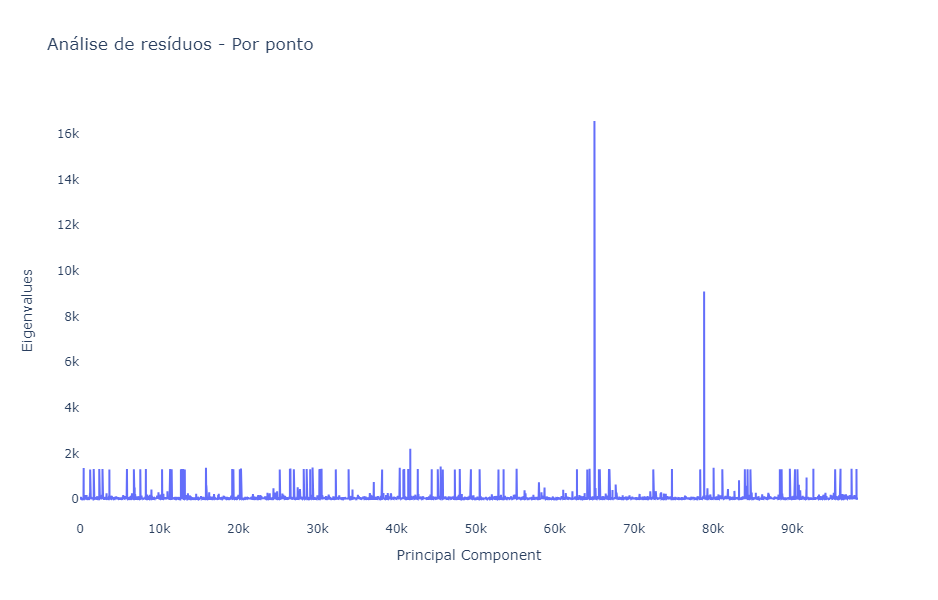

In [51]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=list(range(1,distance_point.shape[0]+1)), y=distance_point, mode='lines'))

fig.update_layout(plot_bgcolor='rgba(0,0,0,0)')

fig.update_layout(
    title='Análise de resíduos - Por ponto',
    xaxis=dict(title='Principal Component', showgrid=True),
    yaxis=dict(title='Eigenvalues', showgrid=True),
    width=800, 
    height=600)

fig.show()

##### Análise por coluna

In [52]:
variance_col_original = np.var(base_all_scaled, axis=0)
variance_col_reconstructed = np.var(reconstructed_matrix, axis=0)

In [53]:
var_explained_feature = variance_col_reconstructed/variance_col_original

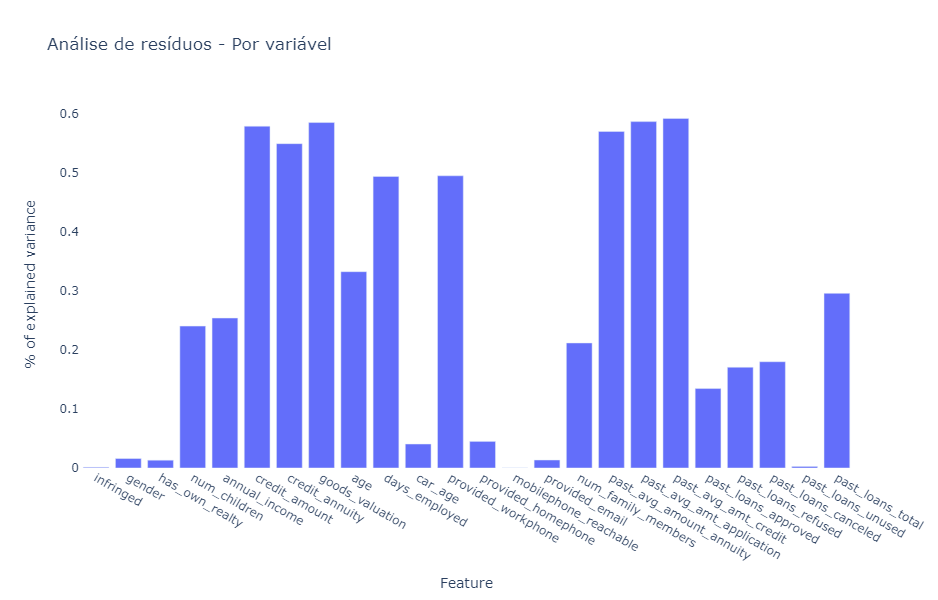

In [54]:
fig = go.Figure()

fig.add_trace(go.Bar(x=var_explained_feature.index, y=var_explained_feature))

fig.update_layout(plot_bgcolor='rgba(0,0,0,0)')

fig.update_layout(
    title='Análise de resíduos - Por variável',
    xaxis=dict(title='Feature', showgrid=True),
    yaxis=dict(title='% of explained variance', showgrid=True),
    width=800, 
    height=600)

fig.show()

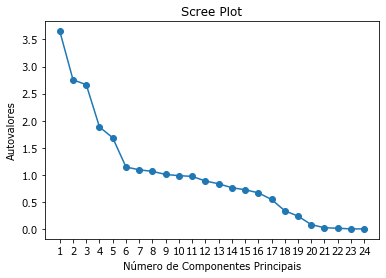

In [55]:
### Retoando o Scree Plot
plt.plot(range(1, len(explained_variance) + 1), eigenvalues, marker='o', linestyle='-')
plt.xticks(np.arange(1, len(explained_variance) + 1, step=1))
plt.xlabel('Número de Componentes Principais')
plt.ylabel('Autovalores')
plt.title('Scree Plot')

plt.show()

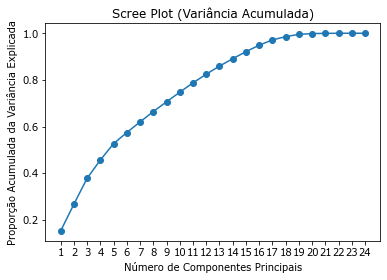

In [56]:
# Calcule os autovalores acumulados
cumulative_eigenvalues = np.cumsum(eigenvalues)

# Calcule a proporção acumulada da variância explicada
explained_variance_ratio = cumulative_eigenvalues / np.sum(eigenvalues)

# Crie o gráfico de Scree Plot com autovalores acumulados
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o', linestyle='-')
plt.xticks(np.arange(1, len(explained_variance_ratio) + 1, step=1))
plt.xlabel('Número de Componentes Principais')
plt.ylabel('Proporção Acumulada da Variância Explicada')
plt.title('Scree Plot (Variância Acumulada)')

plt.show()

#### Reforça-se que com 10 componente se explica 75% da variação total de X.

In [57]:
# Criando os pontos no novo plano
scores = np.array([base_all_pca[:, 0], base_all_pca[:, 1]])

# Número total de pontos
total_points = scores.shape[1]

# Trabalhando com apenas 1% dos dados, porque são muitos
num_points_to_select = total_points // 100

# Gerando índices aleatórios para selecionar os pontos
random_indices = np.random.choice(total_points, size=num_points_to_select, replace=False)

# Selecione os pontos correspondentes aos índices gerados aleatoriamente
selected_scores = scores[:, random_indices]

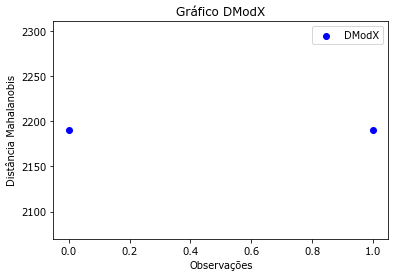

In [58]:
from scipy.spatial import distance

# Calcule as distâncias Mahalanobis dos pontos de dados aos centroides
centroid = np.mean(selected_scores, axis=0)
DModX = [distance.mahalanobis(point, centroid, np.cov(selected_scores.T)) for point in selected_scores]

# Plote o gráfico DModX
plt.scatter(range(len(DModX)), DModX, c='b', label='DModX', marker='o')
plt.xlabel('Observações')
plt.ylabel('Distância Mahalanobis')
plt.legend()
plt.title('Gráfico DModX')
plt.show()

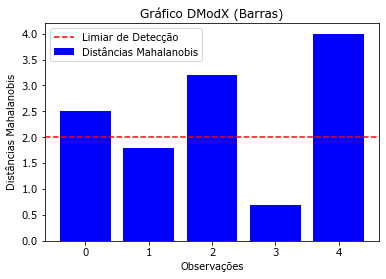

In [ ]:
distancias_mahalanobis = [2.5, 1.8, 3.2, 0.7, 4.0]  # Substitua pelos seus próprios valores

# Defina um limiar de detecção (opcional)
limiar = 2.0

# Crie um gráfico de barras das distâncias Mahalanobis
plt.bar(range(len(distancias_mahalanobis)), distancias_mahalanobis, color='b', label='Distâncias Mahalanobis')
plt.axhline(y=limiar, color='r', linestyle='--', label='Limiar de Detecção')
plt.xlabel('Observações')
plt.ylabel('Distâncias Mahalanobis')
plt.legend()
plt.title('Gráfico DModX (Barras)')
plt.show()

### **4. Análise Base Homens - Base Mulheres**

In [59]:
print(f"Male data shape: {base_m.shape}\nFemale data shape: {base_f.shape}")

Male data shape: (55693, 23)
Female data shape: (42643, 23)


### 4.1. Primeiras infos PCA

In [60]:
import plotly.graph_objects as go

In [61]:
# Inicialize o modelo PCA com o número de componentes desejado (por exemplo, 2 componentes)
pca_man = PCA(n_components=len(base_m.columns))
pca_woman = PCA(n_components=len(base_m.columns))
pca_man.fit_transform(base_m)
pca_woman.fit_transform(base_f)

pcs = np.array(range(1,27))

### 4.2. Scree plot

Coloquei vários tipos de gráficos para depois vermos qual preferimos colocar na apresentação

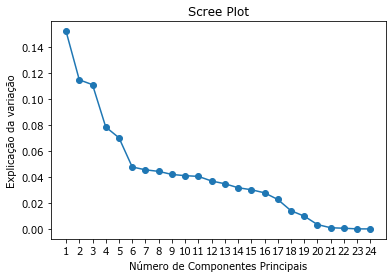

In [62]:
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-')
plt.xticks(np.arange(1, len(explained_variance) + 1, step=1))
plt.xlabel('Número de Componentes Principais')
plt.ylabel('Explicação da variação')
plt.title('Scree Plot')

plt.show()

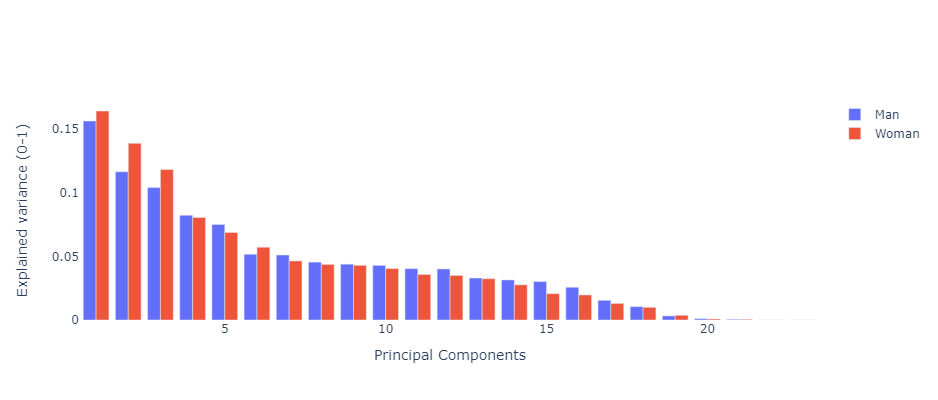

In [63]:
# Obtenha as proporções de variância explicada
explained_variance_man = pca_man.explained_variance_ratio_
explained_variance_woman = pca_woman.explained_variance_ratio_

# Obtenha os autovalores
eigenvalues_man = pca_man.explained_variance_
eigenvalues_woman = pca_woman.explained_variance_

fig = go.Figure(data=[
    go.Bar(name='Man', x=pcs, y=explained_variance_man),
    go.Bar(name='Woman', x=pcs, y=explained_variance_woman)
])
# Change the bar mode
fig.update_layout(barmode='group',
                  plot_bgcolor='white',  
                  xaxis=dict(title='Principal Components'),
                  yaxis=dict(title='Explained variance (0-1)'),
                  width=600, 
                  height=400)
fig.show()

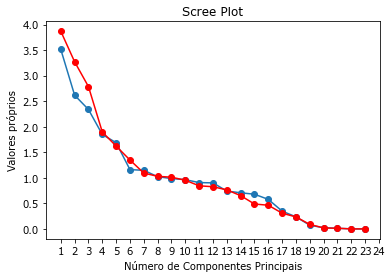

In [64]:
plt.plot(range(1, len(explained_variance_man) + 1), eigenvalues_man, marker='o', linestyle='-')
plt.plot(range(1, len(explained_variance_man) + 1), eigenvalues_woman, marker='o', linestyle='-', color='r')
plt.xticks(np.arange(1, len(explained_variance) + 1, step=1))
plt.xlabel('Número de Componentes Principais')
plt.ylabel('Valores próprios')
plt.title('Scree Plot')

plt.show()

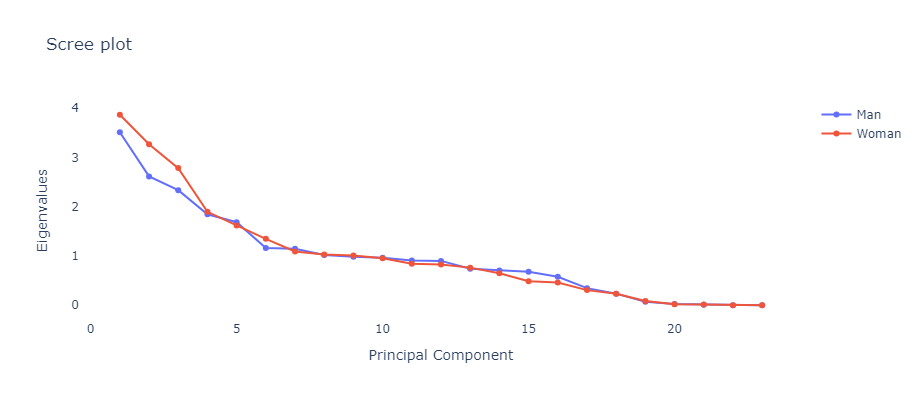

In [65]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=pcs, y=eigenvalues_man, mode='lines+markers', name='Man'))

fig.add_trace(go.Scatter(x=pcs, y=eigenvalues_woman, mode='lines+markers', name='Woman'))

fig.update_layout(plot_bgcolor='rgba(0,0,0,0)')

fig.update_layout(
    title='Scree plot',
    xaxis=dict(title='Principal Component', showgrid=True),
    yaxis=dict(title='Eigenvalues', showgrid=True),
    width=600, 
    height=400)

fig.show()

### 4.1. Loadings

In [66]:
eigenvectors_man = pca_man.components_
eigenvectors_woman = pca_woman.components_

eigenvectors_df_man = pd.DataFrame(eigenvectors_man, columns=base_m.columns)
eigenvectors_df_woman = pd.DataFrame(eigenvectors_woman, columns=base_f.columns)

# Agora, para cada componente principal, você pode ver como as variáveis originais contribuem para ele.
# Por exemplo, para o primeiro componente principal:
component_1_man = eigenvectors_df_man.iloc[0]
component_2_man = eigenvectors_df_man.iloc[1]

component_1_woman = eigenvectors_df_woman.iloc[0]
component_2_woman = eigenvectors_df_woman.iloc[1]

In [67]:
print("Contribuição das variáveis para o primeiro componente principal nos homens:")
print(component_1_man.sort_values(ascending=False))

Contribuição das variáveis para o primeiro componente principal nos homens:
past_avg_amt_credit         0.406807
past_avg_amt_application    0.406519
past_avg_amount_annuity     0.398857
goods_valuation             0.334381
credit_amount               0.332763
credit_annuity              0.327107
annual_income               0.273852
past_loans_total            0.171531
past_loans_canceled         0.144112
past_loans_refused          0.122397
age                         0.117657
past_loans_approved         0.115128
provided_email              0.055409
num_family_members          0.020051
has_own_realty              0.017138
days_employed               0.006861
mobilephone_reachable       0.000289
provided_workphone         -0.007991
num_children               -0.010568
past_loans_unused          -0.017753
infringed                  -0.019853
provided_homephone         -0.026263
car_age                    -0.089273
Name: 0, dtype: float64


In [68]:
print("Contribuição das variáveis para o primeiro componente principal nas mulheres:")
print(component_1_woman.sort_values(ascending=False))

Contribuição das variáveis para o primeiro componente principal nas mulheres:
past_avg_amt_credit         0.377042
past_avg_amt_application    0.374904
past_avg_amount_annuity     0.372524
goods_valuation             0.322412
credit_amount               0.319937
credit_annuity              0.300501
past_loans_total            0.203724
age                         0.203649
annual_income               0.186557
past_loans_canceled         0.158934
past_loans_refused          0.152372
past_loans_approved         0.144539
days_employed               0.143612
provided_email              0.052827
has_own_realty              0.018658
mobilephone_reachable      -0.006482
infringed                  -0.016087
past_loans_unused          -0.034885
provided_homephone         -0.051065
car_age                    -0.103427
num_family_members         -0.119800
num_children               -0.144355
provided_workphone         -0.144836
Name: 0, dtype: float64


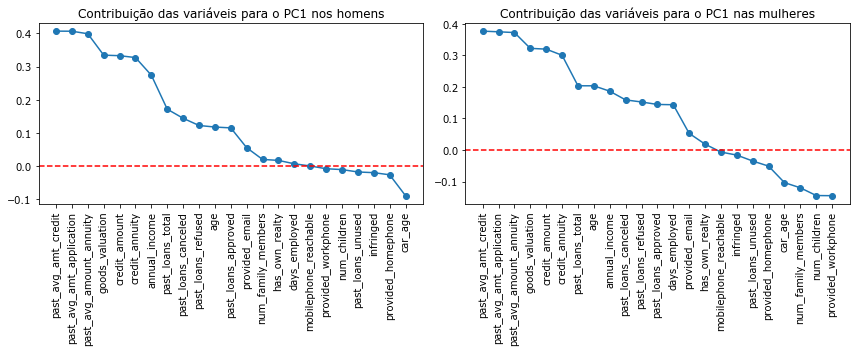

In [69]:
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

axs[0].set_title('Contribuição das variáveis para o PC1 nos homens')
axs[0].plot(component_1_man.sort_values(ascending=False), marker='o', linestyle='-')
axs[0].axhline(y=0, color='red', linestyle='--')
axs[0].tick_params(axis='x', rotation=90)

axs[1].set_title('Contribuição das variáveis para o PC1 nas mulheres')
axs[1].plot(component_1_woman.sort_values(ascending=False), marker='o', linestyle='-')
axs[1].axhline(y=0, color='red', linestyle='--')
axs[1].tick_params(axis='x', rotation=90)

plt.tight_layout()

plt.show()

In [70]:
print("Contribuição das variáveis para a segunda componente principal nos homens:")
print(component_2_man.sort_values(ascending=False))

Contribuição das variáveis para a segunda componente principal nos homens:
past_loans_total            0.501377
past_loans_canceled         0.402874
past_loans_refused          0.340315
past_loans_approved         0.339725
past_avg_amt_credit         0.106714
past_avg_amount_annuity     0.093836
past_avg_amt_application    0.093565
past_loans_unused           0.092428
provided_email              0.059168
infringed                   0.055815
has_own_realty              0.042850
car_age                     0.008978
provided_workphone          0.005114
mobilephone_reachable      -0.002810
days_employed              -0.004541
provided_homephone         -0.032331
num_children               -0.035008
age                        -0.042269
num_family_members         -0.045669
annual_income              -0.112258
credit_annuity             -0.278849
goods_valuation            -0.325851
credit_amount              -0.326079
Name: 1, dtype: float64


In [71]:
print("Contribuição das variáveis para a segunda componente principal nas mulheres:")
print(component_2_woman.sort_values(ascending=False))

Contribuição das variáveis para a segunda componente principal nas mulheres:
provided_workphone          0.539062
num_children                0.250558
num_family_members          0.245734
credit_annuity              0.196252
goods_valuation             0.183194
credit_amount               0.182520
provided_homephone          0.125642
annual_income               0.115916
past_avg_amount_annuity     0.102336
past_avg_amt_credit         0.086611
past_avg_amt_application    0.085596
provided_email              0.067862
infringed                   0.018705
past_loans_unused           0.017082
mobilephone_reachable       0.002669
past_loans_canceled        -0.001152
past_loans_approved        -0.016520
past_loans_total           -0.019388
past_loans_refused         -0.030176
has_own_realty             -0.040430
car_age                    -0.068564
age                        -0.350090
days_employed              -0.539094
Name: 1, dtype: float64


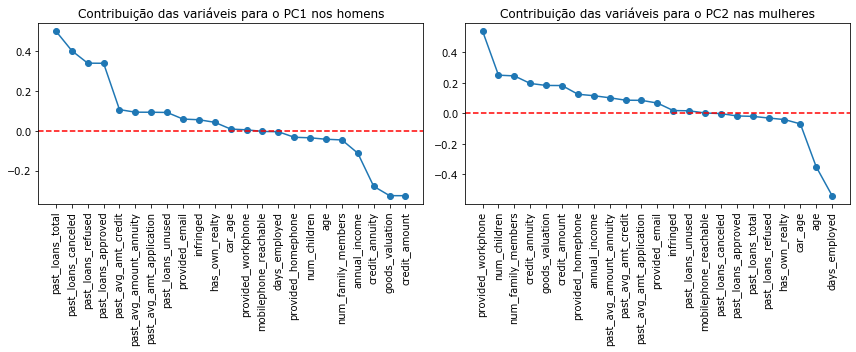

In [72]:
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

axs[0].set_title('Contribuição das variáveis para o PC1 nos homens')
axs[0].plot(component_2_man.sort_values(ascending=False), marker='o', linestyle='-')
axs[0].axhline(y=0, color='red', linestyle='--')
axs[0].tick_params(axis='x', rotation=90)

axs[1].set_title('Contribuição das variáveis para o PC2 nas mulheres')
axs[1].plot(component_2_woman.sort_values(ascending=False), marker='o', linestyle='-')
axs[1].axhline(y=0, color='red', linestyle='--')
axs[1].tick_params(axis='x', rotation=90)

plt.tight_layout()

plt.show()

### Resumo dos Loadings

In [73]:
pca_m = PCA(n_components=2)
pca_m.fit(base_m)
base_all_pca_man = pca_m.transform(base_m)

pca_f = PCA(n_components=2)
pca_f.fit(base_f)
base_all_pca_woman = pca_f.transform(base_f)

In [74]:
loadings = pd.DataFrame(pca_m.components_.T, columns=['PC1','PC2'], index=base_m.columns)
round(loadings,3)

,PC1,PC2
infringed,-0.020,0.056
has_own_realty,0.017,0.043
num_children,-0.011,-0.035
annual_income,0.274,-0.112
credit_amount,0.333,-0.326
credit_annuity,0.327,-0.279
goods_valuation,0.334,-0.326
age,0.118,-0.042
days_employed,0.007,-0.005
car_age,-0.089,0.009


In [75]:
loadings = pd.DataFrame(pca_f.components_.T, columns=['PC1','PC2'], index=base_m.columns)
round(loadings,3)

,PC1,PC2
infringed,-0.016,0.019
has_own_realty,0.019,-0.040
num_children,-0.144,0.251
annual_income,0.187,0.116
credit_amount,0.320,0.183
credit_annuity,0.301,0.196
goods_valuation,0.322,0.183
age,0.204,-0.350
days_employed,0.144,-0.539
car_age,-0.103,-0.069


### 4.4. Loading plot

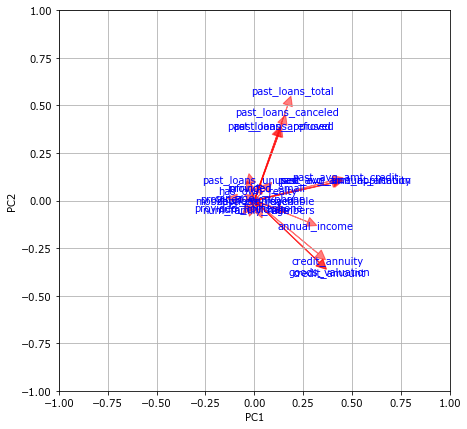

In [76]:
fig, ax = plt.subplots(figsize = (7,7))
loading_plot(pca_m.components_.T, base_m.columns)

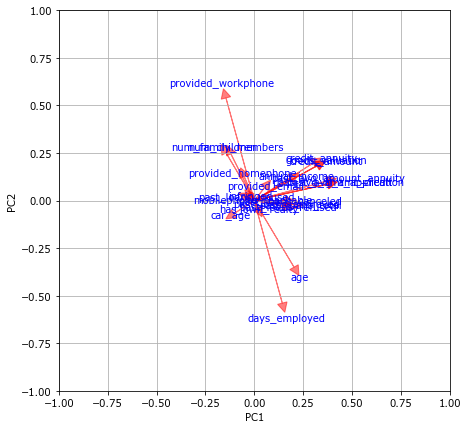

In [77]:
fig, ax = plt.subplots(figsize = (7,7))
loading_plot(pca_f.components_.T, base_f.columns)

### 4.5. Score plot

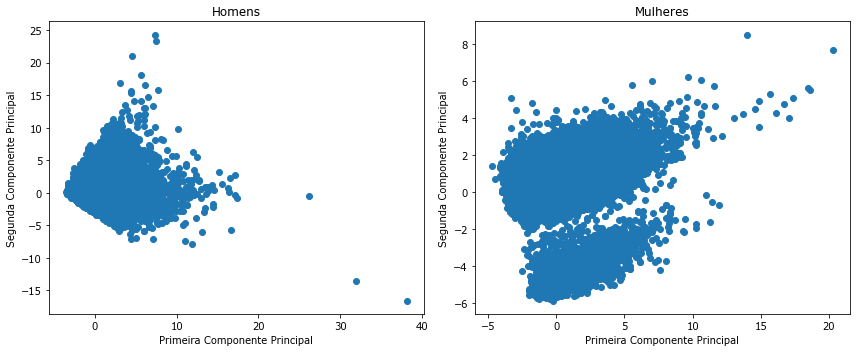

In [78]:
# Create a 1x2 grid of subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Scatter plot for the first subplot
axs[0].scatter(base_all_pca_man[:, 0], base_all_pca_man[:, 1])
axs[0].set_xlabel('Primeira Componente Principal')
axs[0].set_ylabel('Segunda Componente Principal')
axs[0].set_title('Homens')

# Scatter plot for the second subplot
axs[1].scatter(base_all_pca_woman[:, 0], base_all_pca_woman[:, 1])
axs[1].set_xlabel('Primeira Componente Principal')
axs[1].set_ylabel('Segunda Componente Principal')
axs[1].set_title('Mulheres')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

Tal como no score plot dos dados todos, conseguimos observar que apenas existe um clusters, havendo alguns outliers com valor de PC1 superior a 3 ou valor de PC2 superior a 2

### 4.6. Análise de resíduos

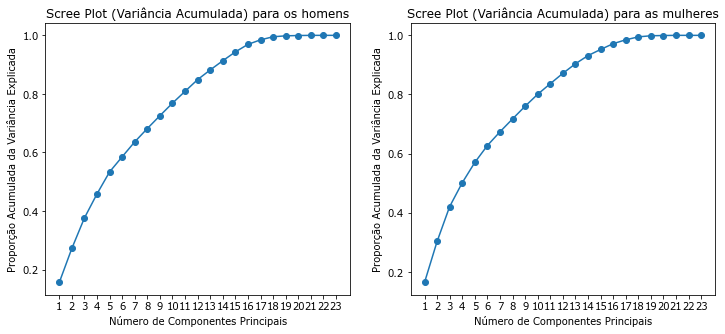

In [79]:
# Calcule os autovalores acumulados
cumulative_eigenvalues_man = np.cumsum(eigenvalues_man)
cumulative_eigenvalues_woman = np.cumsum(eigenvalues_woman)

# Calcule a proporção acumulada da variância explicada
explained_variance_ratio_man = cumulative_eigenvalues_man / np.sum(eigenvalues_man)
explained_variance_ratio_woman = cumulative_eigenvalues_woman / np.sum(eigenvalues_woman)

# Crie o gráfico de Scree Plot com autovalores acumulados
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

axs[0].plot(range(1, len(explained_variance_ratio_man) + 1), explained_variance_ratio_man, marker='o', linestyle='-')
axs[0].set_xticks(np.arange(1, len(explained_variance_ratio_man) + 1, step=1))
axs[0].set_xlabel('Número de Componentes Principais')
axs[0].set_ylabel('Proporção Acumulada da Variância Explicada')
axs[0].set_title('Scree Plot (Variância Acumulada) para os homens')

axs[1].plot(range(1, len(explained_variance_ratio_woman) + 1), explained_variance_ratio_woman, marker='o', linestyle='-')
axs[1].set_xticks(np.arange(1, len(explained_variance_ratio_woman) + 1, step=1))
axs[1].set_xlabel('Número de Componentes Principais')
axs[1].set_ylabel('Proporção Acumulada da Variância Explicada')
axs[1].set_title('Scree Plot (Variância Acumulada) para as mulheres')

plt.show()

In [80]:
reconstructed_matrix_man = pca_m.inverse_transform(base_all_pca_man)
reconstructed_matrix_woman = pca_f.inverse_transform(base_all_pca_woman)

In [81]:
e_man = base_m - reconstructed_matrix_man
e_woman = base_f - reconstructed_matrix_woman

##### Análise por linha

In [82]:
distance_point_man = np.sum(e_man**2, axis=1)
distance_point_woman = np.sum(e_woman**2, axis=1)

print(distance_point_man.shape[0])

55693


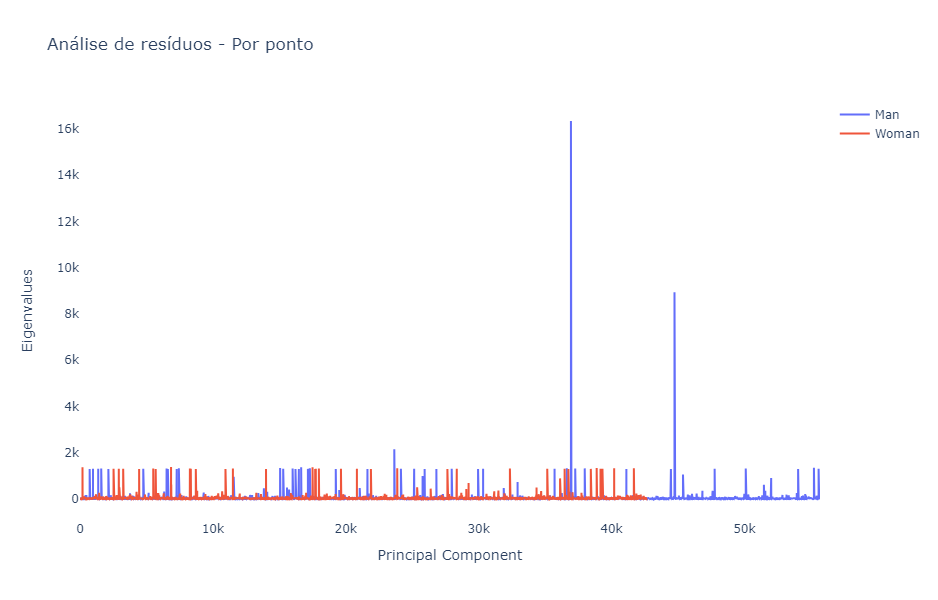

In [83]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=list(range(1,distance_point_man.shape[0]+1)), y=distance_point_man, mode='lines', name='Man'))

fig.add_trace(go.Scatter(x=list(range(1,distance_point_woman.shape[0]+1)), y=distance_point_woman, mode='lines', name='Woman'))

fig.update_layout(plot_bgcolor='rgba(0,0,0,0)')

fig.update_layout(
    title='Análise de resíduos - Por ponto',
    xaxis=dict(title='Principal Component', showgrid=True),
    yaxis=dict(title='Eigenvalues', showgrid=True),
    width=800, 
    height=600)

fig.show()

##### Análise por coluna

In [84]:
variance_col_original_man = variances_per_column = np.var(base_m, axis=0)
variance_col_reconstructed_man = variances_per_column = np.var(reconstructed_matrix_man, axis=0)
variance_col_residue_man = variances_per_column = np.var(e_man, axis=0)

variance_col_original_woman = variances_per_column = np.var(base_f, axis=0)
variance_col_reconstructed_woman = variances_per_column = np.var(reconstructed_matrix_woman, axis=0)
variance_col_residue_woman = variances_per_column = np.var(e_woman, axis=0)

In [85]:
var_explained_feature_man = variance_col_reconstructed_man/variance_col_original_man
var_explained_feature_woman = variance_col_reconstructed_woman/variance_col_original_woman

var_explained_feature_man= var_explained_feature_man.sort_index()
var_explained_feature_woman = var_explained_feature_woman.sort_index()

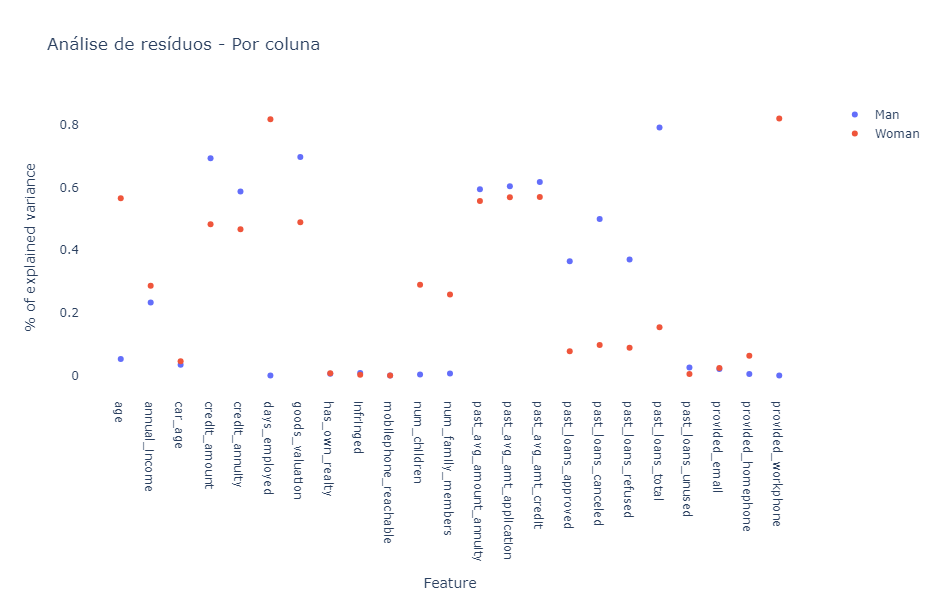

In [86]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=var_explained_feature_man.index, y=var_explained_feature_man, mode='markers', name='Man'))

fig.add_trace(go.Scatter(x=var_explained_feature_woman.index, y=var_explained_feature_woman, mode='markers', name='Woman'))

fig.update_layout(plot_bgcolor='rgba(0,0,0,0)')

fig.update_layout(
    title='Análise de resíduos - Por coluna',
    xaxis=dict(title='Feature', showgrid=True),
    yaxis=dict(title='% of explained variance', showgrid=True),
    width=800, 
    height=600)

fig.show()

In [87]:
#scores_man = np.array([base_all_pca_man[:, 0], base_all_pca_man[:, 1]])
#scores_woman = np.array([base_all_pca_woman[:, 0], base_all_pca_woman[:, 1]])

In [88]:
# Obtenha o número total de pontos
#total_points_man = scores_man.shape[1]
#total_points_woman = scores_woman.shape[1]

# Trabalhando com apenas 1% dos dados, porque são muitos
#num_points_to_select = total_points // 100

# Gere índices aleatórios para selecionar os pontos
#random_indices_man = np.random.choice(total_points_man, size=num_points_to_select, replace=False)
#random_indices_woman = np.random.choice(total_points_woman, size=num_points_to_select, replace=False)

# Selecione os pontos correspondentes aos índices gerados aleatoriamente
#selected_scores_man = scores_man[:, random_indices_man]
#selected_scores_woman = scores_woman[:, random_indices_woman]

In [89]:
#from scipy.spatial.distance import cdist

#centroid_man = np.mean(selected_scores_man, axis=0)
#centroid_woman = np.mean(selected_scores_woman, axis=0)

#distancias_mahalanobis_man = cdist(selected_scores_man, centroid_man.reshape(1, -1), 'mahalanobis', VI=np.linalg.inv(np.cov(selected_scores_man)))
#distancias_mahalanobis_woman = cdist(selected_scores_woman, centroid_woman.reshape(1, -1), 'mahalanobis', VI=np.linalg.inv(np.cov(selected_scores_woman)))

In [90]:
#from scipy.spatial import distance

# Calcule as distâncias Mahalanobis dos pontos de dados aos centroides
#centroid_man = np.mean(selected_scores_man, axis=0)
#centroid_woman = np.mean(selected_scores_woman, axis=0)

#DModX_man = [distance.mahalanobis(point, centroid_man, np.cov(selected_scores_man.T)) for point in selected_scores_man]
#DModX_woman = [distance.mahalanobis(point, centroid_woman, np.cov(selected_scores_woman.T)) for point in selected_scores_woman]

# Plote o gráfico DModX

#fig, axs = plt.subplots(1, 2, figsize=(12, 5))

#axs[0].scatter(range(len(DModX_man)), DModX_man, c='b', label='DModX', marker='o')
#axs[0].set_xlabel('Observações')
#axs[0].set_ylabel('Distância Mahalanobis')
#axs[0].legend()
#axs[0].set_title('Gráfico DModX para homens')

#axs[1].scatter(range(len(DModX_woman)), DModX_woman, c='b', label='DModX', marker='o')
#axs[1].set_xlabel('Observações')
#axs[1].set_ylabel('Distância Mahalanobis')
#axs[1].legend()
#axs[1].set_title('Gráfico DModX para mulheres')

#plt.show()

In [91]:
#distancias_mahalanobis_man = [2.5, 1.8, 3.2, 0.7, 4.0]  # Substitua pelos seus próprios valores
#distancias_mahalanobis_woman = [2.5, 1.8, 3.2, 0.7, 4.0]  # Substitua pelos seus próprios valores

# Defina um limiar de detecção (opcional)
#limiar = 2.0

#fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Crie um gráfico de barras das distâncias Mahalanobis
#axs[0].bar(range(len(distancias_mahalanobis_man)), distancias_mahalanobis_man, color='b', label='Distâncias Mahalanobis')
#axs[0].axhline(y=limiar, color='r', linestyle='--', label='Limiar de Detecção')
#axs[0].set_xlabel('Observações')
#axs[0].set_ylabel('Distâncias Mahalanobis')
#axs[0].legend()
#axs[0].set_title('Gráfico DModX (Barras)')

#axs[1].bar(range(len(distancias_mahalanobis_woman)), distancias_mahalanobis_woman, color='b', label='Distâncias Mahalanobis')
#axs[1].axhline(y=limiar, color='r', linestyle='--', label='Limiar de Detecção')
#axs[1].set_xlabel('Observações')
#axs[1].set_ylabel('Distâncias Mahalanobis')
#axs[1].legend()
#axs[1].set_title('Gráfico DModX (Barras)')

#plt.show()